In [134]:
import os
import random
import librosa
import librosa.display
import pandas as pd
import numpy as np
import IPython.display as ipd
import matplotlib.pyplot as plt

In [135]:
categories = [
  "Ambulance", "Bird", "Engine", "Explosion", "Fire-and-trucks",
  "Human", "Police", "Rail-transport", "Train-horn", "Vehicle",
]
HOP_LENGTH = 512
NUM_FFT = 2048
FRAME_SIZE = 1024

In [136]:
def select_random_audio(_category):
  directory = 'datasets/final_final/'
  files = os.listdir(directory)
  
  category_files = [file for file in files if file.startswith(_category)]

  if not category_files:
    print(f"No files with category {_category}")
    return None

  selected_file = random.choice(category_files)
  return os.path.join(directory, selected_file)

In [137]:
random_audio_list = []
for index, category in enumerate(categories):
  audio_ = select_random_audio(category)
  signal, sr = librosa.load(audio_)
  random_audio_list.append({
    "type": category.replace("-", " "),
    "audio": audio_,
    "signal": signal,
    "sr": sr,
  })

In [138]:
ipd.Audio(random_audio_list[0]["audio"])

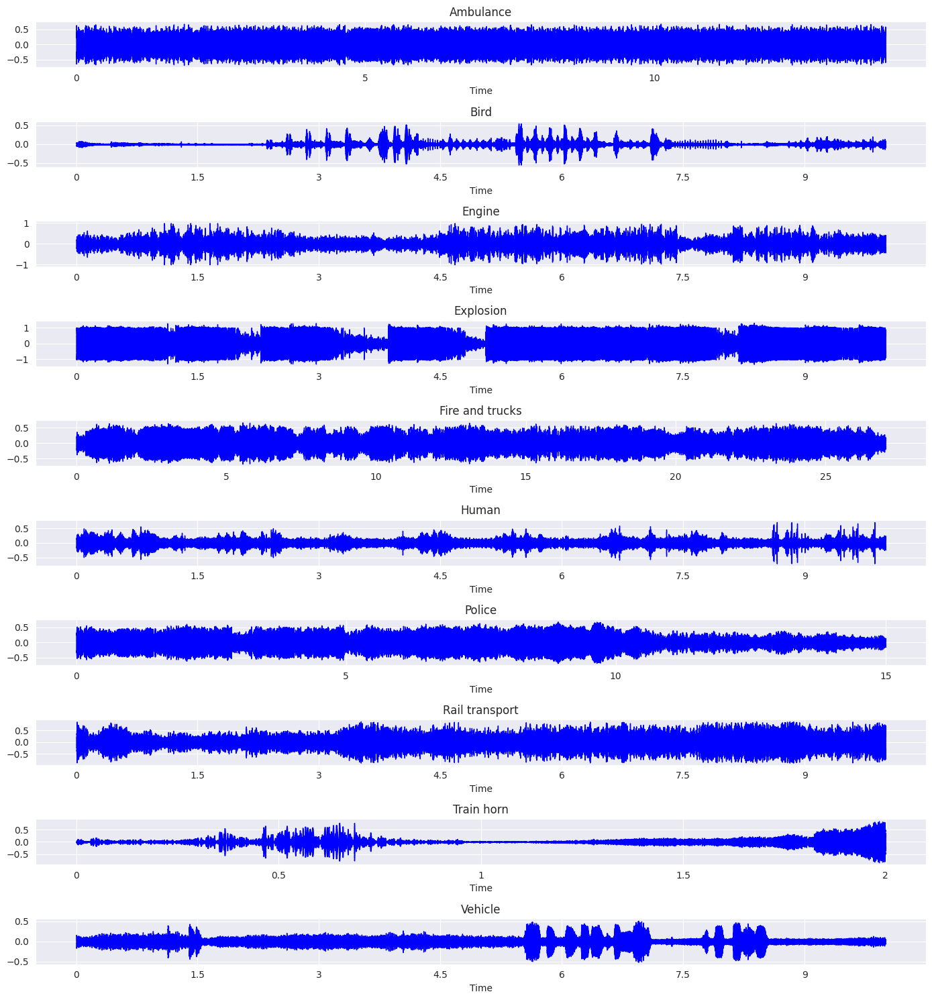

In [139]:
plt.figure(figsize=(14, 15))

for index, category in enumerate(categories):
  plt.subplot(10, 1, index+1)
  librosa.display.waveshow(random_audio_list[index]["signal"],
                           sr=random_audio_list[index]["sr"], color="blue")
  plt.title(random_audio_list[index]["type"])

plt.tight_layout()
plt.show()

# Sound Envelope

In [140]:
def sound_envelope(_signal):
  envelope_arr = []
  # calculate on each frame
  for i in range(0, len(_signal), HOP_LENGTH):
    current_frame = max(_signal[i:i + FRAME_SIZE]) # frame size=1024
    envelope_arr.append(current_frame)
  return np.array(envelope_arr)

In [141]:
for index, _audio in enumerate(random_audio_list):
  _signal = sound_envelope(random_audio_list[index]["signal"])
  random_audio_list[index]["envelope"] = _signal
  frames = range(len(_signal))
  t = librosa.frames_to_time(frames, hop_length=HOP_LENGTH)
  random_audio_list[index]["frames_to_time"] = t

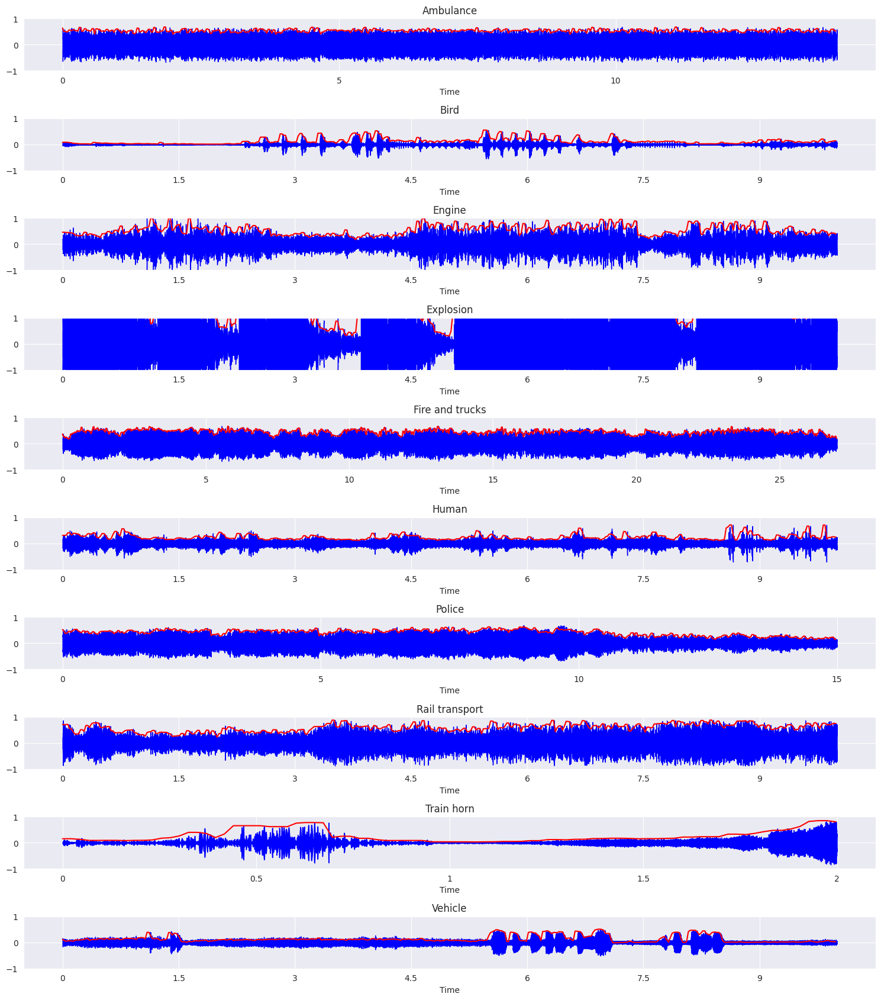

In [142]:
plt.figure(figsize=(15, 17))

for index, category in enumerate(categories):
  plt.subplot(10, 1, index+1)
  librosa.display.waveshow(random_audio_list[index]["signal"],
                           sr=random_audio_list[index]["sr"],
                           color="blue")
  plt.plot(random_audio_list[index]["frames_to_time"],
           random_audio_list[index]["envelope"], color="r")
  plt.ylim((-1, 1))
  plt.title(random_audio_list[index]["type"])

plt.tight_layout()
plt.show()

# Root Mean Squared energy

In [143]:
for index, _audio in enumerate(random_audio_list):
  rms_signal = librosa.feature.rms(y=random_audio_list[index]["signal"],
                                   frame_length=FRAME_SIZE, hop_length=HOP_LENGTH)[0]
  random_audio_list[index]["rms_signal"] = rms_signal
  
  rms_frames = range(len(rms_signal))
  random_audio_list[index]["rms_frame_to_time"] = librosa.frames_to_time(rms_frames,
                                                                        hop_length=HOP_LENGTH)

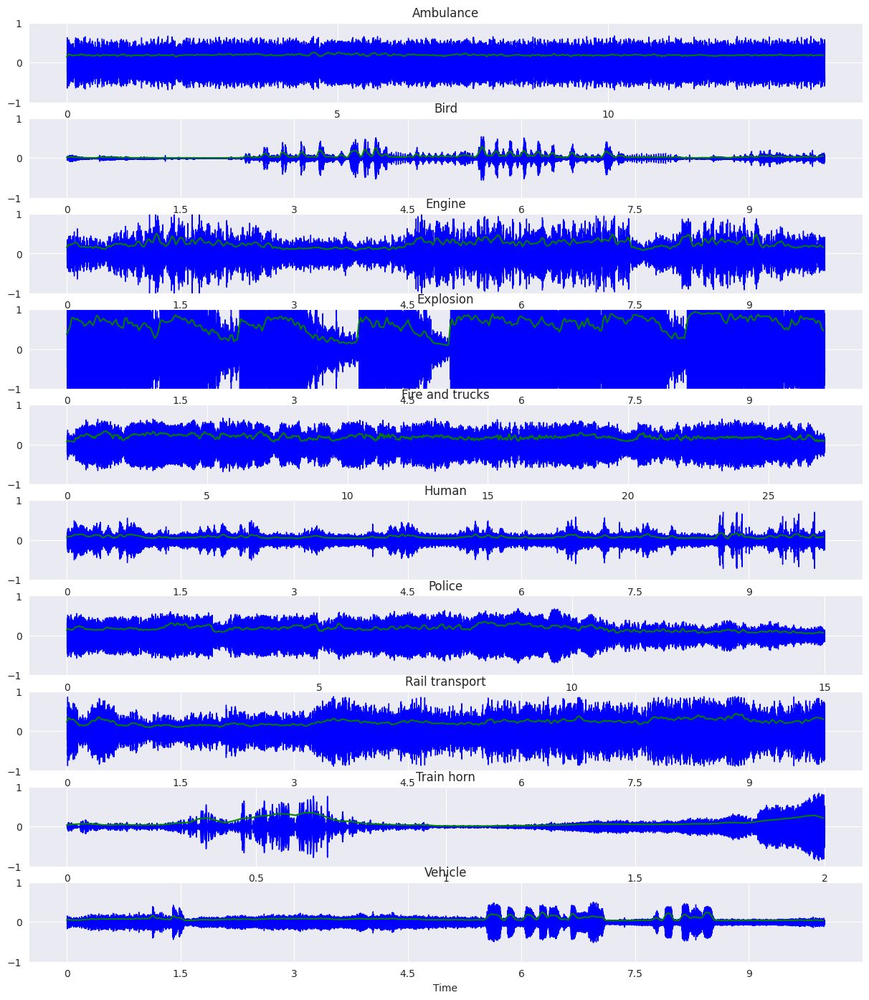

In [144]:
plt.figure(figsize=(15, 17))

for index, category in enumerate(categories):
  plt.subplot(10, 1, index+1)
  librosa.display.waveshow(random_audio_list[index]["signal"],
                           sr=random_audio_list[index]["sr"],
                           color="blue")
  plt.plot(random_audio_list[index]["rms_frame_to_time"],
           random_audio_list[index]["rms_signal"], color="g")
  plt.ylim((-1, 1))
  plt.title(random_audio_list[index]["type"])

plt.show()

## Mel spectrogram

In [145]:
for index, _audio in enumerate(random_audio_list):
  random_audio_list[index]["mel_spectrogram"] = librosa.feature.melspectrogram(
    y=random_audio_list[index]["signal"],
    sr=random_audio_list[index]["sr"],
    n_fft=NUM_FFT, hop_length=HOP_LENGTH)

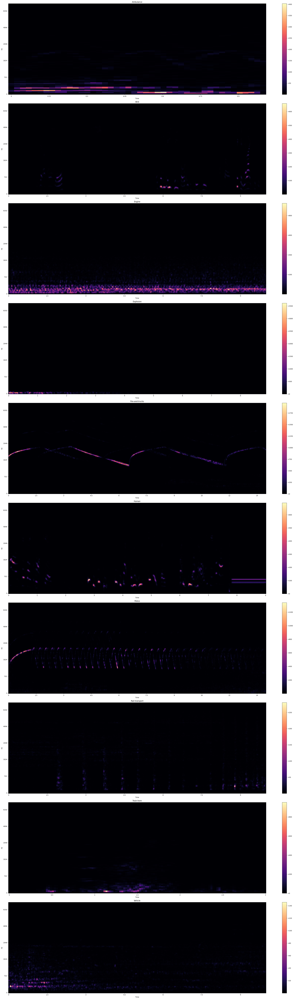

In [146]:
plt.figure(figsize=(15, 45))

for index, category in enumerate(categories[0:1]):
  plt.subplot(10, 1, index+1)
  librosa.display.specshow(random_audio_list[index]["mel_spectrogram"],
                           sr=random_audio_list[index]["sr"],
                           hop_length=HOP_LENGTH, x_axis="time", y_axis="mel")
  plt.ylim((-1, 1))
  plt.title(random_audio_list[index]["type"])
  plt.colorbar(format="%+2.f")

plt.tight_layout()
plt.show()
# top mean more energy

In [147]:
for index, _audio in enumerate(random_audio_list):
  random_audio_list[index]["mel_spectrogram_db"] = librosa.power_to_db(
    random_audio_list[index]["mel_spectrogram"])

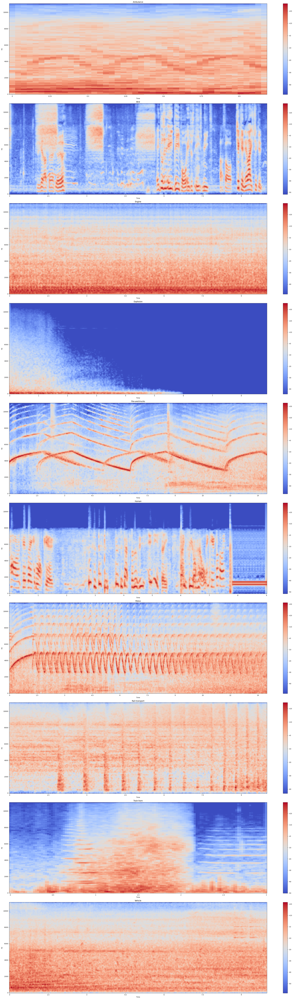

In [148]:
plt.figure(figsize=(30, 100))

for index, category in enumerate(categories):
  plt.subplot(10, 1, index+1)
  librosa.display.specshow(random_audio_list[index]["mel_spectrogram_db"],
                           sr=random_audio_list[index]["sr"],
                           hop_length=HOP_LENGTH, x_axis="time", y_axis="linear")
  plt.ylim((-1, 1))
  plt.title(random_audio_list[index]["type"])
  plt.colorbar(format="%+2.f")

plt.tight_layout()
plt.show()

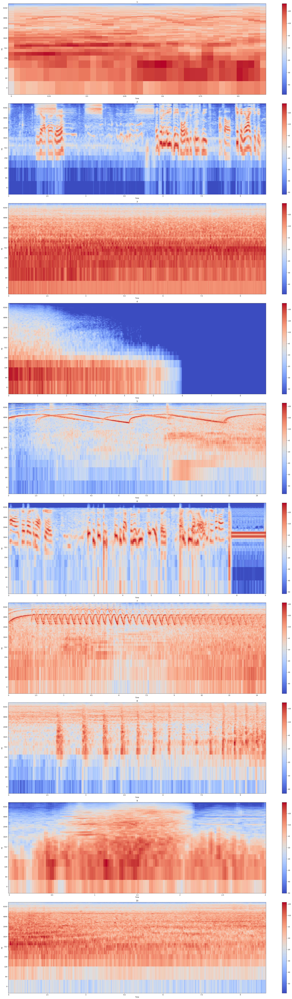

In [149]:
plt.figure(figsize=(30, 100))

for index, category in enumerate(categories):
  plt.subplot(10, 1, index+1)
  librosa.display.specshow(random_audio_list[index]["mel_spectrogram_db"],
                           sr=random_audio_list[index]["sr"],
                           hop_length=HOP_LENGTH, x_axis="time", y_axis="log")
  plt.ylim((-1, 1))
  plt.title(random_audio_list[index]["type"])
  plt.colorbar(format="%+2.f")

plt.tight_layout()
plt.show()

# END